In [2]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import time
from scipy.fft import fft, fftfreq, rfft, rfftfreq
import matplotlib.pyplot as plt

In [2]:
input_df = pd.read_csv('../../Data/Input v2.csv', sep=';')
input_df

,DATA,corrente_neutro,corrente_f1,corrente_f2,corrente_f3,tensao_f1,tensao_f2,tensao_f3
0,23/03/2022 11:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,23/03/2022 10:59,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,23/03/2022 10:59,9.53,4.16,3.35,2.02,254.2,254.0,254.1
3,23/03/2022 10:59,9.56,4.17,3.35,2.03,254.1,253.9,254.0
4,23/03/2022 10:59,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
601,23/03/2022 07:31,NaN,NaN,NaN,NaN,NaN,NaN,NaN
602,23/03/2022 07:31,9.44,4.12,3.33,1.98,252.1,251.8,251.8
603,23/03/2022 07:31,NaN,NaN,NaN,NaN,NaN,NaN,NaN
604,23/03/2022 07:30,9.36,4.07,3.34,1.95,251.8,251.6,251.6


In [3]:
input_df.dropna(inplace=True)

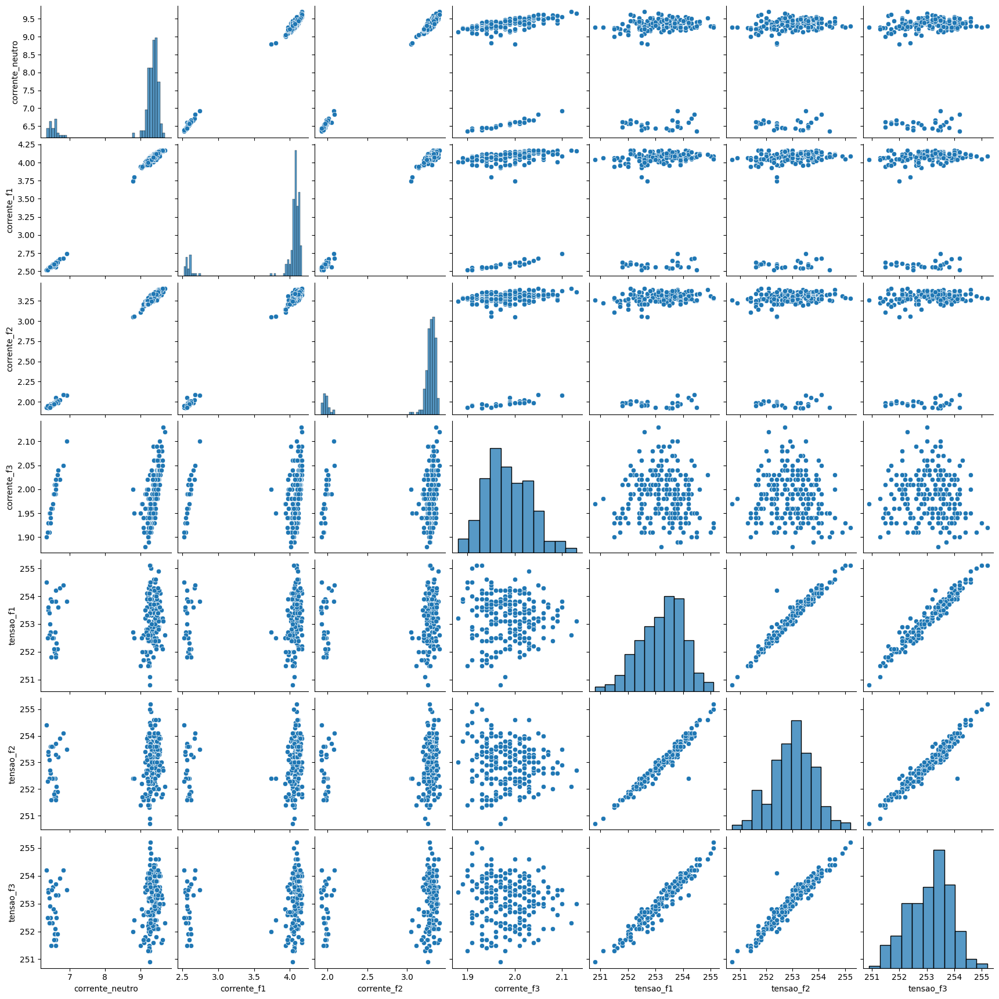

In [4]:
sns.pairplot(data=input_df)

In [5]:
px.histogram(input_df, x='corrente_neutro')

In [6]:
validacao_df = pd.read_csv('../../Data/Validação v2.csv', encoding='unicode_escape', header=[0,1], sep=';')
validacao_df

,Unnamed: 0_level_0,Kwh (Consumo),Unnamed: 2_level_0,Unnamed: 3_level_0,Unnamed: 4_level_0,kVAh,Unnamed: 6_level_0,Unnamed: 7_level_0,Unnamed: 8_level_0,kvarh,...,Unnamed: 26_level_0,Unnamed: 27_level_0,Unnamed: 28_level_0,ºC,V,Unnamed: 31_level_0,Unnamed: 32_level_0,º,Unnamed: 34_level_0,Unnamed: 35_level_0
,Data,energia_ativa_f1,energia_ativa_f2,energia_ativa_f3,energia_ativa_total,energia_aparente_f1,energia_aparente_f2,energia_aparente_f3,energia_aparente_total,energia_reativa_f2,...,potencia_reativa_f2,potencia_reativa_f3,potencia_reativa_total,temperatura,tensao_f1_f2,tensao_f2_f3,tensao_f3_f1,angulo_tensao_f1,angulo_tensao_f2,angulo_tensao_f3
0,23/03/2022 10:59,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,711,-86,953,24,"440,29","439,94","440,11",0.0,119.7,-120.1
1,23/03/2022 10:59,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,709,-89,950,24,"440,11","439,77","439,94",0.0,119.7,-120.1
2,23/03/2022 10:58,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,700,-83,948,24,"440,11","439,77","439,94",0.0,119.7,-120.0
3,23/03/2022 10:57,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,691,-86,950,24,"439,59","439,07","439,59",0.0,119.7,-120.0
4,23/03/2022 10:56,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,685,-80,940,24,"438,38","438,04","438,56",0.0,119.8,-119.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
252,23/03/2022 07:03,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,704,-68,988,25,"437,86","437,69","437,69",NaN,NaN,NaN
253,23/03/2022 07:02,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,702,-57,1001,25,"436,3","435,96","435,96",NaN,NaN,NaN
254,23/03/2022 07:01,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,692,-82,928,26,"437,17","437,17",437,NaN,NaN,NaN


In [7]:
validacao_df.columns = ['_'.join(col) for col in validacao_df.columns]

In [8]:
validacao_df.columns

Index(['Unnamed: 0_level_0_Data', 'Kwh (Consumo)_energia_ativa_f1',
       'Unnamed: 2_level_0_energia_ativa_f2',
       'Unnamed: 3_level_0_energia_ativa_f3',
       'Unnamed: 4_level_0_energia_ativa_total', 'kVAh_energia_aparente_f1',
       'Unnamed: 6_level_0_energia_aparente_f2',
       'Unnamed: 7_level_0_energia_aparente_f3',
       'Unnamed: 8_level_0_energia_aparente_total', 'kvarh_energia_reativa_f2',
       'Unnamed: 10_level_0_energia_reativa_f1',
       'Unnamed: 11_level_0_energia_reativa_f3',
       'Unnamed: 12_level_0_energia_reativa_total',
       'Unnamed: 13_level_0_fator_potencia_f1',
       'Unnamed: 14_level_0_fator_potencia_f2',
       'Unnamed: 15_level_0_fator_potencia_f3',
       'Unnamed: 16_level_0_Fator_Potencia_Total', 'VA_potencia_aparente_f1',
       'Unnamed: 18_level_0_potencia_aparente_f2',
       'Unnamed: 19_level_0_potencia_aparente_f3',
       'Unnamed: 20_level_0_potencia_aparente_total', 'W_potencia_ativa_f1',
       'Unnamed: 22_level_0_potenc

In [9]:
validacao_df.columns = ['DATA','energia_ativa_f1 Kwh (Consumo)',
       'energia_ativa_f2 Kwh (Consumo)',
       'energia_ativa_f3 Kwh (Consumo)',
       'energia_ativa_total Kwh (Consumo)', 
       'energia_aparente_f1 kVAh',
       'energia_aparente_f2 kVAh',
       'energia_aparente_f3 kVAh',
       'energia_aparente_total kVAh',
       'energia_reativa_f2 kvarh',
       'energia_reativa_f1 kvarh',
       'energia_reativa_f3 kvarh',
       'energia_reativa_total kvarh',
       'fator_potencia_f1 kvarh',
       'fator_potencia_f2 kvarh',
       'fator_potencia_f3 kvarh',
       'Fator_Potencia_Total kvarh', 
       'potencia_aparente_f1 VA',
       'potencia_aparente_f2 VA',
       'potencia_aparente_f3 VA',
       'potencia_aparente_total VA',
       'potencia_ativa_f1 W',
       'potencia_ativa_f2 W',
       'potencia_ativa_f3 W',
       'potencia_ativa_total W', 
       'potencia_reativa_f1 var',
       'potencia_reativa_f2 var',
       'potencia_reativa_f3 var',
       'potencia_reativa_total var',
       'temperatura ºC',
       'tensao_f1_f2 V',
       'tensao_f2_f3 V',
       'tensao_f3_f1 V',
       'angulo_tensao_f1 º',
       'angulo_tensao_f2 º',
       'angulo_tensao_f3 º']

In [10]:
validacao_df.drop_duplicates()

,DATA,energia_ativa_f1 Kwh (Consumo),energia_ativa_f2 Kwh (Consumo),energia_ativa_f3 Kwh (Consumo),energia_ativa_total Kwh (Consumo),energia_aparente_f1 kVAh,energia_aparente_f2 kVAh,energia_aparente_f3 kVAh,energia_aparente_total kVAh,energia_reativa_f2 kvarh,...,potencia_reativa_f2 var,potencia_reativa_f3 var,potencia_reativa_total var,temperatura ºC,tensao_f1_f2 V,tensao_f2_f3 V,tensao_f3_f1 V,angulo_tensao_f1 º,angulo_tensao_f2 º,angulo_tensao_f3 º
0,23/03/2022 10:59,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,711,-86,953,24,"440,29","439,94","440,11",0.0,119.7,-120.1
1,23/03/2022 10:59,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,709,-89,950,24,"440,11","439,77","439,94",0.0,119.7,-120.1
2,23/03/2022 10:58,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,700,-83,948,24,"440,11","439,77","439,94",0.0,119.7,-120.0
3,23/03/2022 10:57,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,691,-86,950,24,"439,59","439,07","439,59",0.0,119.7,-120.0
4,23/03/2022 10:56,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,685,-80,940,24,"438,38","438,04","438,56",0.0,119.8,-119.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
252,23/03/2022 07:03,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,704,-68,988,25,"437,86","437,69","437,69",NaN,NaN,NaN
253,23/03/2022 07:02,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,702,-57,1001,25,"436,3","435,96","435,96",NaN,NaN,NaN
254,23/03/2022 07:01,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,692,-82,928,26,"437,17","437,17",437,NaN,NaN,NaN
255,23/03/2022 07:01,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,690,-61,1000,26,"437,69","437,52","437,52",NaN,NaN,NaN


In [11]:
validacao_df.isna().sum(), validacao_df.shape

(DATA                                  0
 energia_ativa_f1 Kwh (Consumo)        0
 energia_ativa_f2 Kwh (Consumo)        0
 energia_ativa_f3 Kwh (Consumo)        0
 energia_ativa_total Kwh (Consumo)     0
 energia_aparente_f1 kVAh              0
 energia_aparente_f2 kVAh              0
 energia_aparente_f3 kVAh              0
 energia_aparente_total kVAh           0
 energia_reativa_f2 kvarh              0
 energia_reativa_f1 kvarh              0
 energia_reativa_f3 kvarh              0
 energia_reativa_total kvarh           0
 fator_potencia_f1 kvarh               0
 fator_potencia_f2 kvarh               0
 fator_potencia_f3 kvarh               0
 Fator_Potencia_Total kvarh            0
 potencia_aparente_f1 VA               0
 potencia_aparente_f2 VA               0
 potencia_aparente_f3 VA               0
 potencia_aparente_total VA            0
 potencia_ativa_f1 W                   0
 potencia_ativa_f2 W                   0
 potencia_ativa_f3 W                   0
 potencia_ativa_

In [12]:
input_df.isna().sum(), input_df.shape

(DATA               0
 corrente_neutro    0
 corrente_f1        0
 corrente_f2        0
 corrente_f3        0
 tensao_f1          0
 tensao_f2          0
 tensao_f3          0
 dtype: int64,
 (225, 8))

In [13]:
indx = input_df.loc[input_df.DATA.isin(validacao_df.DATA)].index
#input_df.loc[~input_df.DATA.isin(validacao_df.DATA)]
idx = validacao_df.loc[validacao_df.DATA.isin(input_df.DATA)].index
validacao_df.loc[~validacao_df.DATA.isin(input_df.DATA)]

,DATA,energia_ativa_f1 Kwh (Consumo),energia_ativa_f2 Kwh (Consumo),energia_ativa_f3 Kwh (Consumo),energia_ativa_total Kwh (Consumo),energia_aparente_f1 kVAh,energia_aparente_f2 kVAh,energia_aparente_f3 kVAh,energia_aparente_total kVAh,energia_reativa_f2 kvarh,...,potencia_reativa_f2 var,potencia_reativa_f3 var,potencia_reativa_total var,temperatura ºC,tensao_f1_f2 V,tensao_f2_f3 V,tensao_f3_f1 V,angulo_tensao_f1 º,angulo_tensao_f2 º,angulo_tensao_f3 º
225,23/03/2022 07:29,"0,004",0,"0,001","0,006","0,006","0,004","0,003","0,013","0,004",...,682,-55,1013,25,"435,96","435,61","435,61",NaN,NaN,NaN
226,23/03/2022 07:28,"0,002",0,"0,001","0,003","0,004","0,003","0,003","0,009","0,001",...,227,-88,353,25,"436,48","436,13","435,96",NaN,NaN,NaN
227,23/03/2022 07:27,"0,002",0,"0,001","0,003","0,004","0,003","0,003","0,009","0,001",...,221,-79,354,25,"436,13","435,78","436,13",NaN,NaN,NaN
228,23/03/2022 07:26,"0,002",0,"0,001","0,003","0,004","0,003","0,003","0,009","0,001",...,230,-80,354,25,"436,3","436,13","435,96",NaN,NaN,NaN
229,23/03/2022 07:25,"0,002",0,"0,001","0,003","0,004","0,003","0,003","0,01","0,001",...,241,-76,377,24,"436,3","435,96","435,78",NaN,NaN,NaN
230,23/03/2022 07:24,"0,002",0,"0,001","0,003","0,004","0,003","0,003","0,01","0,001",...,240,-76,391,24,"435,44","435,09","434,92",NaN,NaN,NaN
231,23/03/2022 07:23,"0,002",0,"0,001","0,003","0,004","0,003","0,003","0,01","0,001",...,244,-78,406,24,437,"436,3","436,13",NaN,NaN,NaN
232,23/03/2022 07:22,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,621,-72,874,24,437,"436,3","436,65",NaN,NaN,NaN
233,23/03/2022 07:21,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,717,-71,988,25,"438,21","437,86","437,86",NaN,NaN,NaN
234,23/03/2022 07:20,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,703,-68,980,25,"436,82","436,3","436,3",NaN,NaN,NaN


In [14]:
input_df.loc[indx]
df1 = pd.merge(validacao_df.loc[idx], input_df.loc[indx], on='DATA', how='left').drop_duplicates()

In [15]:
df1

,DATA,energia_ativa_f1 Kwh (Consumo),energia_ativa_f2 Kwh (Consumo),energia_ativa_f3 Kwh (Consumo),energia_ativa_total Kwh (Consumo),energia_aparente_f1 kVAh,energia_aparente_f2 kVAh,energia_aparente_f3 kVAh,energia_aparente_total kVAh,energia_reativa_f2 kvarh,...,angulo_tensao_f1 º,angulo_tensao_f2 º,angulo_tensao_f3 º,corrente_neutro,corrente_f1,corrente_f2,corrente_f3,tensao_f1,tensao_f2,tensao_f3
0,23/03/2022 10:59,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,0.0,119.7,-120.1,9.53,4.16,3.35,2.02,254.2,254.0,254.1
1,23/03/2022 10:59,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,0.0,119.7,-120.1,9.56,4.17,3.35,2.03,254.1,253.9,254.0
2,23/03/2022 10:59,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,0.0,119.7,-120.1,9.53,4.16,3.35,2.02,254.2,254.0,254.1
3,23/03/2022 10:59,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,0.0,119.7,-120.1,9.56,4.17,3.35,2.03,254.1,253.9,254.0
4,23/03/2022 10:58,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,0.0,119.7,-120.0,9.45,4.12,3.31,2.02,254.1,253.9,254.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
266,23/03/2022 07:34,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,0.0,119.7,-120.0,9.32,4.04,3.24,2.04,253.0,252.8,253.1
267,23/03/2022 07:33,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,013","0,004",...,0.0,119.6,-120.0,9.48,4.10,3.32,2.06,253.4,253.2,253.2
268,23/03/2022 07:32,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,0.0,119.7,-120.0,9.49,4.13,3.36,2.00,253.4,253.3,253.3
269,23/03/2022 07:31,"0,005","0,001","0,001","0,007","0,006","0,005","0,003","0,014","0,004",...,0.0,119.6,-120.1,9.44,4.12,3.33,1.98,252.1,251.8,251.8


In [16]:
df1.columns

Index(['DATA', 'energia_ativa_f1 Kwh (Consumo)',
       'energia_ativa_f2 Kwh (Consumo)', 'energia_ativa_f3 Kwh (Consumo)',
       'energia_ativa_total Kwh (Consumo)', 'energia_aparente_f1 kVAh',
       'energia_aparente_f2 kVAh', 'energia_aparente_f3 kVAh',
       'energia_aparente_total kVAh', 'energia_reativa_f2 kvarh',
       'energia_reativa_f1 kvarh', 'energia_reativa_f3 kvarh',
       'energia_reativa_total kvarh', 'fator_potencia_f1 kvarh',
       'fator_potencia_f2 kvarh', 'fator_potencia_f3 kvarh',
       'Fator_Potencia_Total kvarh', 'potencia_aparente_f1 VA',
       'potencia_aparente_f2 VA', 'potencia_aparente_f3 VA',
       'potencia_aparente_total VA', 'potencia_ativa_f1 W',
       'potencia_ativa_f2 W', 'potencia_ativa_f3 W', 'potencia_ativa_total W',
       'potencia_reativa_f1 var', 'potencia_reativa_f2 var',
       'potencia_reativa_f3 var', 'potencia_reativa_total var',
       'temperatura ºC', 'tensao_f1_f2 V', 'tensao_f2_f3 V', 'tensao_f3_f1 V',
       'angulo_ten

In [17]:
cols = ['DATA', 'corrente_neutro',
        'potencia_reativa_f1 var', 'potencia_reativa_f2 var','potencia_reativa_f3 var','potencia_reativa_total var',
        'potencia_ativa_f1 W','potencia_ativa_f2 W', 'potencia_ativa_f3 W','potencia_ativa_total W', 
        'fator_potencia_f1 kvarh','fator_potencia_f2 kvarh', 'fator_potencia_f3 kvarh','Fator_Potencia_Total kvarh', 
        'energia_ativa_total Kwh (Consumo)', 'energia_reativa_total kvarh']
df2 = df1[cols].copy()

In [18]:
df2.DATA = pd.to_datetime(df2.DATA, format='%d/%m/%Y %H:%M')
#df1.sort_values(by='DATA', ascending=False, inplace=True)
for col in df2.select_dtypes('object').columns:
    df2[col] = df2[col].str.replace(',','.').astype('float')

In [19]:
fig1 = go.Figure(data=go.Scatterpolar(
    r=df2.DATA,
    #r=100*df2['potencia_reativa_f2 var']/df2['potencia_reativa_total var'],
    theta=100*df2['potencia_reativa_f1 var']/df2['potencia_reativa_total var'],
    name='Potencia Reativa f1',
    #mode='markers'
))

fig2 = go.Figure(data=go.Scatterpolar(
    r=df2.DATA,
    theta=100*df2['potencia_reativa_f2 var']/df2['potencia_reativa_total var'],
    name='Potencia Reativa f2'
))

fig3 = go.Figure(data=go.Scatterpolar(
    r=df2.DATA,
    theta=100*df2['potencia_reativa_f3 var']/df2['potencia_reativa_total var'],
    name='Potencia Reativa f3'
))

#fig = go.Figure(data=fig1.data)
fig = go.Figure(data=fig1.data+fig2.data+fig3.data)
fig.update_layout(
    polar=dict(
        radialaxis=dict(angle=-45, ),
        #angularaxis=dict(tickangle=45)
    )
)

fig.show()

In [20]:
fig1 = go.Figure(data=go.Scatterpolar(
    r=df2.DATA,
    theta=100*df2['potencia_ativa_f1 W']/df2['potencia_ativa_total W'],
    name='Potencia Ativa f1'
))

fig2 = go.Figure(
    data=go.Scatterpolar(
    r=df2.DATA,
    theta=100*df2['potencia_ativa_f2 W']/df2['potencia_ativa_total W'],
    name='Potencia Ativa f2'
))

fig3 = go.Figure(data=go.Scatterpolar(
    r=df2.DATA,
    theta=100*df2['potencia_ativa_f3 W']/df2['potencia_ativa_total W'],
    name='Potencia Ativa f3'
))

fig = go.Figure(data=fig1.data+fig2.data+fig3.data)
fig.update_layout(
    polar=dict(
        radialaxis=dict(angle=-45, ),
        #angularaxis=dict(tickangle=45)
    )
)

fig.show()

In [21]:
fig1 = go.Figure(data=go.Scatterpolar(
    r=df2.DATA,
    theta=100*df2['fator_potencia_f1 kvarh']/df2['Fator_Potencia_Total kvarh'],
    name='Fator de Potencia f1'
))

fig2 = go.Figure(data=go.Scatterpolar(
    r=df2.DATA,
    theta=100*df2['fator_potencia_f2 kvarh']/df2['Fator_Potencia_Total kvarh'],
    name='Fator de Potencia f2'
))

fig3 = go.Figure(data=go.Scatterpolar(
    r=df2.DATA,
    theta=100*df2['fator_potencia_f3 kvarh']/df2['Fator_Potencia_Total kvarh'],
    name='Fator de Potencia f3'
))

fig = go.Figure(data=fig1.data+fig2.data+fig3.data)
fig.update_layout(
    polar=dict(
        radialaxis=dict(angle=-45),
        #angularaxis=dict(tickangle=45)
    )
)

fig.show()

In [22]:
fig1 = go.Figure(data=go.Scatterpolar(
    r=df2.DATA,
    theta=100*df2['potencia_reativa_f1 var']/df2['potencia_reativa_total var'],
    name='Potencia Reativa f1'
))

fig2 = go.Figure(data=go.Scatterpolar(
    r=df2.DATA,
    theta=100*df2['potencia_reativa_f2 var']/df2['potencia_reativa_total var'],
    name='Potencia Reativa f2'
))

fig3 = go.Figure(data=go.Scatterpolar(
    r=df2.DATA,
    theta=100*df2['potencia_reativa_f3 var']/df2['potencia_reativa_total var'],
    name='Potencia Reativa f3'
))

fig4 = go.Figure(data=go.Scatterpolar(
    r=df2.DATA,
    theta=100*df2['potencia_ativa_f1 W']/df2['potencia_ativa_total W'],
    name='Potencia Ativa f1'
))

fig5 = go.Figure(data=go.Scatterpolar(
    r=df2.DATA,
    theta=100*df2['potencia_ativa_f2 W']/df2['potencia_ativa_total W'],
    name='Potencia Ativa f2'
))

fig6 = go.Figure(data=go.Scatterpolar(
    r=df2.DATA,
    theta=100*df2['potencia_ativa_f3 W']/df2['potencia_ativa_total W'],
    name='Potencia Ativa f3'
))


fig7 = go.Figure(data=go.Scatterpolar(
    r=df2.DATA,
    theta=100*df2['fator_potencia_f1 kvarh']/df2['Fator_Potencia_Total kvarh'],
    name='Fator de Potencia f1'
))

fig8 = go.Figure(data=go.Scatterpolar(
    r=df2.DATA,
    theta=100*df2['fator_potencia_f2 kvarh']/df2['Fator_Potencia_Total kvarh'],
    name='Fator de Potencia f2'
))

fig9 = go.Figure(data=go.Scatterpolar(
    r=df2.DATA,
    theta=100*df2['fator_potencia_f3 kvarh']/df2['Fator_Potencia_Total kvarh'],
    name='Fator de Potencia f3'
))


fig = go.Figure(data=fig1.data+fig2.data+fig3.data+fig4.data+fig5.data+fig6.data+fig7.data+fig8.data+fig9.data)
fig.update_layout(
    polar=dict(
        radialaxis=dict(angle=-45, tickangle=-90 ),
        #angularaxis=dict(tickangle=45)
    )
)

fig.show()

In [23]:
title = 'Valor Absoluto'
val_total = 'potencia_ativa_total W'
fase_1 = 'potencia_ativa_f1 W'
fase_2 = 'potencia_ativa_f2 W'
fase_3 = 'potencia_ativa_f3 W'
name = 'Potencia Ativa'
fig1 = go.Figure(data=go.Scatter(x=df2.DATA, y=df2[val_total], mode='lines', name=name+' Total'))
fig2 = go.Figure(data=go.Scatter(x=df2.DATA, y=df2[fase_1], mode='lines', name=name+' f1'))
fig3 = go.Figure(data=go.Scatter(x=df2.DATA, y=df2[fase_2], mode='lines', name=name+' f2'))
fig4 = go.Figure(data=go.Scatter(x=df2.DATA, y=df2[fase_3], mode='lines', name=name+' f3'))

#title = 'Valor Porcentual'
#fig1 = go.Figure(data=go.Scatter(x=df2.DATA, y=100*df2['potencia_ativa_f1 W']/df2['potencia_ativa_total W'], mode='lines', name='Potencia Ativa f1'))
#fig2 = go.Figure(data=go.Scatter(x=df2.DATA, y=100*df2['potencia_ativa_f2 W']/df2['potencia_ativa_total W'], mode='lines', name='Potencia Ativa f2'))
#fig3 = go.Figure(data=go.Scatter(x=df2.DATA, y=100*df2['potencia_ativa_f3 W']/df2['potencia_ativa_total W'], mode='lines', name='Potencia Ativa f3'))

fig = go.Figure(data=fig1.data+fig2.data+fig3.data+fig4.data)
fig.update_layout(
    title=dict(text=title, x=0.5, xanchor='center')
)
fig.show()

In [24]:
title = 'Valor Absoluto'
fig1 = go.Figure(data=go.Scatter(x=df2.DATA, y=df2['potencia_reativa_total var'], mode='lines', name='Potencia Reativa Total'))
fig2 = go.Figure(data=go.Scatter(x=df2.DATA, y=df2['potencia_reativa_f1 var'], mode='lines', name='Potencia Reativa f1'))
fig3 = go.Figure(data=go.Scatter(x=df2.DATA, y=df2['potencia_reativa_f2 var'], mode='lines', name='Potencia Reativa f2'))
fig4 = go.Figure(data=go.Scatter(x=df2.DATA, y=df2['potencia_reativa_f3 var'], mode='lines', name='Potencia Reativa f3'))

#title = 'Valor Porcentual'
#fig1 = go.Figure(data=go.Scatter(x=df2.DATA, y=100*df2['potencia_reativa_f1 var']/df2['potencia_reativa_total var'], mode='lines', name='Potencia Reativa f1'))
#fig2 = go.Figure(data=go.Scatter(x=df2.DATA, y=100*df2['potencia_reativa_f2 var']/df2['potencia_reativa_total var'], mode='lines', name='Potencia Reativa f2'))
#fig3 = go.Figure(data=go.Scatter(x=df2.DATA, y=100*df2['potencia_reativa_f3 var']/df2['potencia_reativa_total var'], mode='lines', name='Potencia Reativa f3'))

fig = go.Figure(data=fig1.data+fig2.data+fig3.data+fig4.data)
fig.update_layout(
    title=dict(text=title, x=0.5, xanchor='center')
)
fig.show()

In [25]:
title = 'Valor Absoluto'
fig1 = go.Figure(data=go.Scatter(x=df2.DATA, y=df2['Fator_Potencia_Total kvarh'],name='Fator de Potencia Total'))
fig2 = go.Figure(data=go.Scatter(x=df2.DATA, y=df2['fator_potencia_f1 kvarh'],name='Fator de Potencia f1'))
fig3 = go.Figure(data=go.Scatter(x=df2.DATA, y=df2['fator_potencia_f2 kvarh'],name='Fator de Potencia f2'))
fig4 = go.Figure(data=go.Scatter(x=df2.DATA, y=df2['fator_potencia_f3 kvarh'],name='Fator de Potencia f3'))

#title = 'Valor Porcentual'
#fig1 = go.Figure(data=go.Scatter(x=df2.DATA, y=100*df2['fator_potencia_f1 kvarh']/df2['Fator_Potencia_Total kvarh'], mode='lines', name='Fator de Potencia f1'))
#fig2 = go.Figure(data=go.Scatter(x=df2.DATA, y=100*df2['fator_potencia_f2 kvarh']/df2['Fator_Potencia_Total kvarh'], mode='lines', name='Fator de Potencia f2'))
#fig3 = go.Figure(data=go.Scatter(x=df2.DATA, y=100*df2['fator_potencia_f3 kvarh']/df2['Fator_Potencia_Total kvarh'], mode='lines', name='Fator de Potencia f3'))

fig = go.Figure(data=fig1.data+fig2.data+fig3.data+fig4.data)
fig.update_layout(
    title=dict(text=title, x=0.5, xanchor='center')
)
#fig.update_xaxes(tickmode='linear', dtick=15)
fig.show()

In [26]:
df2['energia_ativa_total Kwh (Consumo)'].value_counts()
#df2['energia_reativa_total kvarh'].value_counts()
df2['Fator_Potencia_Total kvarh'].value_counts()
#df2['corrente_neutro'].value_counts()

0.52    102
0.51     71
0.50     34
0.36     21
0.49     10
0.35      9
0.48      8
0.53      6
0.37      5
0.34      2
0.47      2
0.38      1
Name: Fator_Potencia_Total kvarh, dtype: int64

In [27]:
df2['Hora'] = df2.DATA.dt.strftime('%H:%M')

In [28]:
fig = px.scatter(
    df2, 
    y='Fator_Potencia_Total kvarh',
    x='corrente_neutro',
    size='energia_ativa_total Kwh (Consumo)',
    color='energia_reativa_total kvarh',
    hover_data=['Hora'],
    size_max=13
)
fig.show()

# Análise de Vibração
## Leitura dos dados
- O tempo foi fixado a partir do nome do arquivo e distribuindo linearmente este tempo entre o total das entradas por arquivo
- As leituras foram tomadas entre a Segunda Feira 25 de Julho do ano 2022 às 22 horas e a Terça Feira 26 de Julho do ano 2022 às 18 horas
- Potência do equipamento é 250 W (informação externa)

In [3]:
PATH = '../../Data/Dados de Vibração e Temperatura/'
direct = os.listdir(PATH)
df = []
direct
for n, dr in enumerate(direct):
    print(n,' lendo:', dr)
    start, end = int(str(dr).strip('.csv').split('-')[0]), int(str(dr).strip('.csv').split('-')[1]) 
    datetime_start = time.strftime("%a, %d %b %Y %H:%M:%S +0000", time.localtime(start))
    datetime_end = time.strftime("%a, %d %b %Y %H:%M:%S +0000", time.localtime(end))
    print(f'Dados desde {datetime_start} até {datetime_end}')
    vib_df = pd.read_csv(PATH+dr, names=['x','y','z','Temperature  ºC'], sep=',')
    t_i = pd.to_datetime(datetime_start, format="%a, %d %b %Y %H:%M:%S +0000")
    t_f = pd.to_datetime(datetime_end, format="%a, %d %b %Y %H:%M:%S +0000")
    #delta_t = t_f - t_i
    #print(a)
    vib_df['t'] = pd.date_range(t_i, t_f, len(vib_df))
    df.append(vib_df)

0  lendo: 1658799298 - 1658799343.csv
Dados desde Mon, 25 Jul 2022 22:34:58 +0000 até Mon, 25 Jul 2022 22:35:43 +0000
1  lendo: 1658802974 - 1658803028.csv
Dados desde Mon, 25 Jul 2022 23:36:14 +0000 até Mon, 25 Jul 2022 23:37:08 +0000
2  lendo: 1658806645 - 1658806713.csv
Dados desde Tue, 26 Jul 2022 00:37:25 +0000 até Tue, 26 Jul 2022 00:38:33 +0000
3  lendo: 1658810330 - 1658810396.csv
Dados desde Tue, 26 Jul 2022 01:38:50 +0000 até Tue, 26 Jul 2022 01:39:56 +0000
4  lendo: 1658814024 - 1658814091.csv
Dados desde Tue, 26 Jul 2022 02:40:24 +0000 até Tue, 26 Jul 2022 02:41:31 +0000
5  lendo: 1658817708 - 1658817775.csv
Dados desde Tue, 26 Jul 2022 03:41:48 +0000 até Tue, 26 Jul 2022 03:42:55 +0000
6  lendo: 1658821392 - 1658821458.csv
Dados desde Tue, 26 Jul 2022 04:43:12 +0000 até Tue, 26 Jul 2022 04:44:18 +0000
7  lendo: 1658825079 - 1658825146.csv
Dados desde Tue, 26 Jul 2022 05:44:39 +0000 até Tue, 26 Jul 2022 05:45:46 +0000
8  lendo: 1658828764 - 1658828830.csv
Dados desde Tue, 2

In [4]:
dff = pd.DataFrame(columns=df[0].columns)
for n in range(len(df)):
    dff = pd.concat([dff,df[n]], ignore_index=True)

In [5]:
dff

,x,y,z,Temperature ºC,t
0,-8.84,0.97,0.02,38.60,2022-07-25 22:34:58.000000000
1,-8.81,1.40,-0.49,38.55,2022-07-25 22:34:58.003536067
2,-8.91,0.72,-1.68,38.65,2022-07-25 22:34:58.007072135
3,-9.59,-0.79,-2.61,38.60,2022-07-25 22:34:58.010608203
4,-9.85,-1.53,-2.27,38.60,2022-07-25 22:34:58.014144271
...,...,...,...,...,...
255120,-9.22,0.20,-0.38,47.40,2022-07-26 18:02:39.979000156
255121,-9.04,1.58,0.35,47.49,2022-07-26 18:02:39.984250117
255122,-8.96,0.96,-0.77,47.45,2022-07-26 18:02:39.989500078
255123,-9.53,-0.51,-2.03,47.54,2022-07-26 18:02:39.994750039


### Tempos de duração dos registros
Os tempos em cada um dos vente registros oscilam entre $45 s$ e $1 m 8 s$ 

In [6]:
for n in range(len(df)):
    tempo = str(df[n].iloc[-1]['t'] - df[n].iloc[0]['t']).split(' ')[-1]
    horas, minutos, segundos = list(tempo.split(':'))
    print(f'Tempo total no registro {n+1}\n{int(minutos)} minutos e {int(segundos)} segundos\n')
#df[1].iloc[-1]['t'] - df[1].iloc[0]['t']
#df[2].iloc[-1]['t'] - df[2].iloc[0]['t']

Tempo total no registro 1
0 minutos e 45 segundos

Tempo total no registro 2
0 minutos e 54 segundos

Tempo total no registro 3
1 minutos e 8 segundos

Tempo total no registro 4
1 minutos e 6 segundos

Tempo total no registro 5
1 minutos e 7 segundos

Tempo total no registro 6
1 minutos e 7 segundos

Tempo total no registro 7
1 minutos e 6 segundos

Tempo total no registro 8
1 minutos e 7 segundos

Tempo total no registro 9
1 minutos e 6 segundos

Tempo total no registro 10
1 minutos e 6 segundos

Tempo total no registro 11
1 minutos e 8 segundos

Tempo total no registro 12
1 minutos e 7 segundos

Tempo total no registro 13
1 minutos e 5 segundos

Tempo total no registro 14
1 minutos e 7 segundos

Tempo total no registro 15
1 minutos e 6 segundos

Tempo total no registro 16
1 minutos e 6 segundos

Tempo total no registro 17
1 minutos e 8 segundos

Tempo total no registro 18
1 minutos e 6 segundos

Tempo total no registro 19
1 minutos e 7 segundos

Tempo total no registro 20
1 minutos e

### Tempos entre registros
A diferênça temporal entre um registro e o seguinte é sempre maior do que $1 h$ por alguns quantos segundos ($17 s$ em moda) 

In [7]:
for n in range(len(df)-1):
    tempo = str(df[n+1].iloc[0]['t'] - df[n].iloc[-1]['t']).split(' ')[-1]
    horas, minutos, segundos = list(tempo.split(':'))
    print(f'Tempo total entre os registros {n+1} e {n+2}\n{int(horas)} hora com {int(minutos)} minutos e {int(segundos)} segundos\n')

Tempo total entre os registros 1 e 2
1 hora com 0 minutos e 31 segundos

Tempo total entre os registros 2 e 3
1 hora com 0 minutos e 17 segundos

Tempo total entre os registros 3 e 4
1 hora com 0 minutos e 17 segundos

Tempo total entre os registros 4 e 5
1 hora com 0 minutos e 28 segundos

Tempo total entre os registros 5 e 6
1 hora com 0 minutos e 17 segundos

Tempo total entre os registros 6 e 7
1 hora com 0 minutos e 17 segundos

Tempo total entre os registros 7 e 8
1 hora com 0 minutos e 21 segundos

Tempo total entre os registros 8 e 9
1 hora com 0 minutos e 18 segundos

Tempo total entre os registros 9 e 10
1 hora com 0 minutos e 17 segundos

Tempo total entre os registros 10 e 11
1 hora com 0 minutos e 17 segundos

Tempo total entre os registros 11 e 12
1 hora com 0 minutos e 16 segundos

Tempo total entre os registros 12 e 13
1 hora com 0 minutos e 16 segundos

Tempo total entre os registros 13 e 14
1 hora com 0 minutos e 18 segundos

Tempo total entre os registros 14 e 15
1 h

In [8]:
(str(df[n].iloc[-1]['t'] - df[n].iloc[0]['t']).split(' ')[-1]).split(':')

['00', '01', '07']

In [9]:
def tempo_op(df):
    time_components = (str(df.iloc[-1]['t'] - df.iloc[0]['t']).split(' ')[-1]).split(':')
    hours, minutes, seconds = map(int, time_components)
    total_seconds = hours * 3600 + minutes * 60 + seconds
    return total_seconds

In [10]:
total_sec = []
for n in range(len(df)):
    total_sec.append(tempo_op(df[n]))
total_sec    

[45,
 54,
 68,
 66,
 67,
 67,
 66,
 67,
 66,
 66,
 68,
 67,
 65,
 67,
 66,
 66,
 68,
 66,
 67,
 67]

In [11]:
dff

,x,y,z,Temperature ºC,t
0,-8.84,0.97,0.02,38.60,2022-07-25 22:34:58.000000000
1,-8.81,1.40,-0.49,38.55,2022-07-25 22:34:58.003536067
2,-8.91,0.72,-1.68,38.65,2022-07-25 22:34:58.007072135
3,-9.59,-0.79,-2.61,38.60,2022-07-25 22:34:58.010608203
4,-9.85,-1.53,-2.27,38.60,2022-07-25 22:34:58.014144271
...,...,...,...,...,...
255120,-9.22,0.20,-0.38,47.40,2022-07-26 18:02:39.979000156
255121,-9.04,1.58,0.35,47.49,2022-07-26 18:02:39.984250117
255122,-8.96,0.96,-0.77,47.45,2022-07-26 18:02:39.989500078
255123,-9.53,-0.51,-2.03,47.54,2022-07-26 18:02:39.994750039


C:\Users\CarlosSolano.iel\AppData\Local\Temp\ipykernel_15744\1172061596.py:15: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


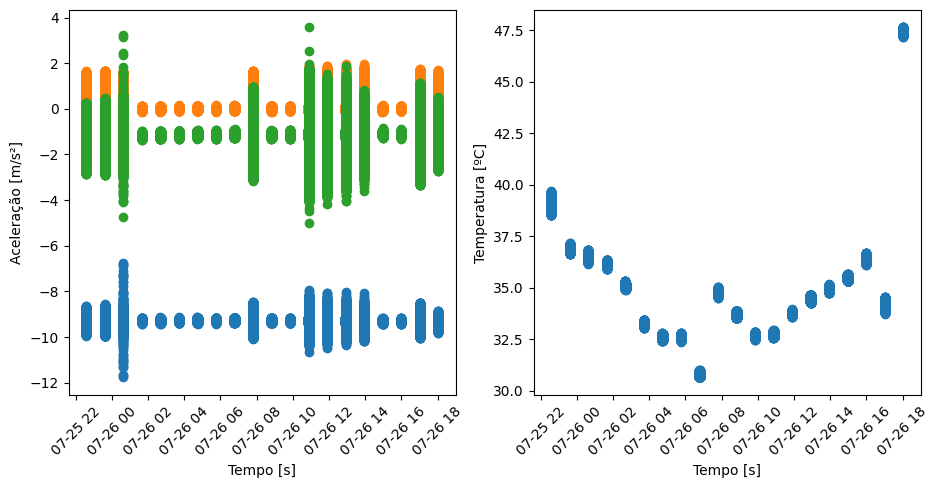

In [12]:
fig, _ = plt.subplots(figsize=(11,5))
plt.subplot(121)
plt.scatter(dff.t, dff.x, label='Eixo X')
plt.scatter(dff.t, dff.y, label='Eixo Y')
plt.scatter(dff.t, dff.z, label='Eixo Z')
plt.xlabel('Tempo [s]')
plt.ylabel('Aceleração [m/s²]')
plt.xticks(rotation=45)

plt.subplot(122)
plt.scatter(dff.t, dff['Temperature  ºC'])
plt.xticks(rotation=45)
plt.xlabel('Tempo [s]')
plt.ylabel('Temperatura [ºC]')
fig.show()

### Forma do sinal
A forma do sinal da acelreação é igual sinusoidal para os três eixos $(x,y,z)$

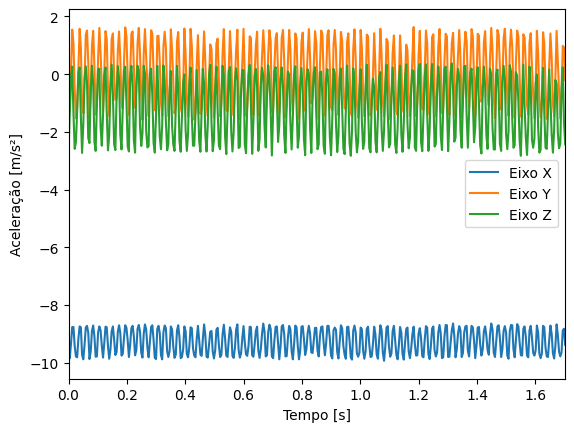

In [13]:
n=1
plt.plot(df[n].index*total_sec[n]/len(df[n]), df[n].x, label='Eixo X')
plt.plot(df[n].index*total_sec[n]/len(df[n]), df[n].y, label='Eixo Y')
plt.plot(df[n].index*total_sec[n]/len(df[n]), df[n].z, label='Eixo Z')
plt.xlim(0,1.7)
plt.xlabel('Tempo [s]')
plt.ylabel('Aceleração [m/s²]')
plt.legend()
plt.show()

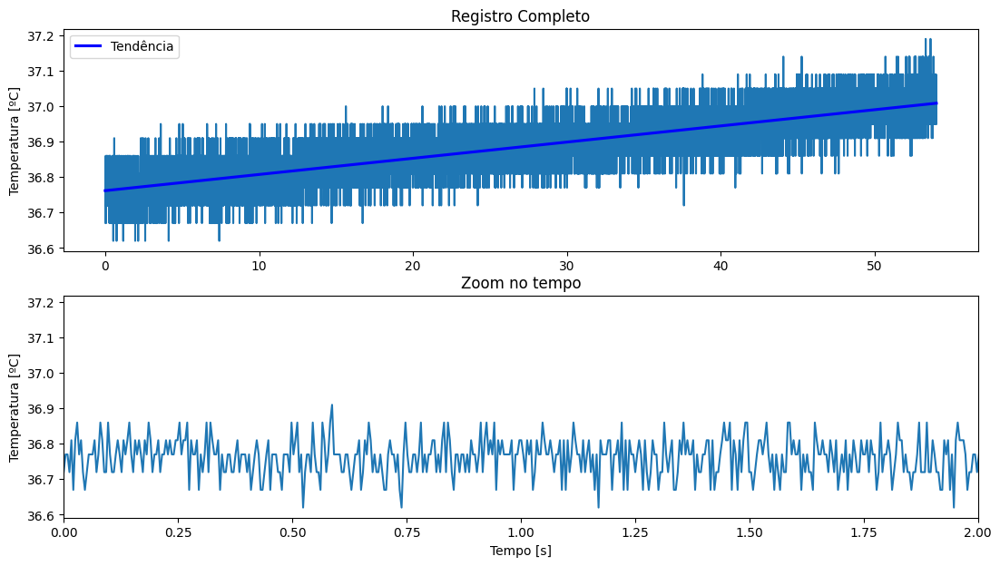

In [14]:
plt.subplots(figsize=(13,7))
plt.subplot(211)
plt.plot(df[n].index*total_sec[n]/len(df[n]), df[n]['Temperature  ºC'])
sns.regplot(data=df[n], x=df[n].index*total_sec[n]/len(df[n]), y=df[n]['Temperature  ºC'],
            line_kws={'color':'b'}, scatter=False, label='Tendência')
#plt.xlim(0,10)
#plt.xlabel('Tempo [s]')
plt.ylabel('Temperatura [ºC]')
plt.title('Registro Completo')
plt.legend()

plt.subplot(212)
plt.plot(df[n].index*total_sec[n]/len(df[n]), df[n]['Temperature  ºC'])
plt.xlim(0,2)
plt.xlabel('Tempo [s]')
plt.ylabel('Temperatura [ºC]')
plt.title('Zoom no tempo')
plt.show()

In [15]:
#!pip install statsmodels

In [18]:
fig = px.scatter(x=df[n].index*total_sec[n]/len(df[n]),y=df[n]['Temperature  ºC'], trendline='ols', trendline_color_override='red')
fig.show()

### Análise RMS e Pico a Pico

In [19]:
x = df[n].x.to_numpy()
y = df[n].y.to_numpy()
z = df[n].z.to_numpy()
t = df[n].t.to_numpy()
t = df[n].index.to_numpy()
N = df[n].shape[0]

In [20]:
rms_x, rms_y, rms_z = np.sqrt(np.mean(x**2)), np.sqrt(np.mean(y**2)), np.sqrt(np.mean(z**2))
print('Valor RMS para os eixos x: %1.2f, y: %1.2f, z: %1.2f' %(rms_x, rms_y, rms_z))

Valor RMS para os eixos x: 9.28, y: 1.08, z: 1.64


In [21]:
pico_pico_x = np.max(x) - np.min(x)
pico_pico_y = np.max(y) - np.min(y)
pico_pico_z = np.max(z) - np.min(z)
print('Valor Pico-Picopara os eixos x: %1.2f, y: %1.2f, z: %1.2f' %(pico_pico_x, pico_pico_y, pico_pico_z))

Valor Pico-Picopara os eixos x: 1.40, y: 3.31, z: 3.39


In [22]:
np.abs(np.mean(x)),np.abs(np.mean(y)),np.abs(np.mean(z))

(9.274592818587186, 0.01744347962137214, 1.2233145583978722)

In [23]:
np.abs(np.mean(x))+(np.sqrt(1.0/2.0))*(pico_pico_x/2.0),\
np.abs(np.mean(y))+(np.sqrt(1.0/2.0))*(pico_pico_y/2.0),\
np.abs(np.mean(z))+(np.sqrt(1.0/2.0))*(pico_pico_z/2.0)

(9.76956756541777, 1.1877052024851082, 2.42186055250907)

### Análise FFT

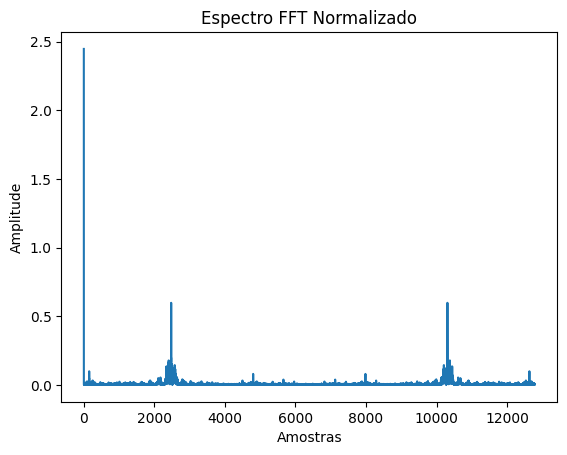

In [24]:
plt.plot(t, np.abs(fft(z))/(N/2.0))
#plt.xlim(2425,2480)
#plt.ylim(-1000,1000)
plt.ylabel('Amplitude')
plt.xlabel('Amostras')
plt.title('Espectro FFT Normalizado')
plt.show()

In [25]:
magnitude_x = abs(fft(x)) 
sample_rate = N/total_sec[0]

In [26]:
#frequencies = fftfreq(n, 1/n_sample)
#frequencies

In [27]:
magnitude_x = magnitude_x[magnitude_x <= 2000]

In [28]:
max_magnitude = np.max(magnitude_x)
threshold = 0.2 * max_magnitude
max_magnitude, threshold

(1511.8550376542253, 302.3710075308451)

In [29]:
significant_peaks_indices = np.where(magnitude_x >= threshold)[0]
frequencies = fftfreq(N, 1/sample_rate)
significant_peaks_frequencies = frequencies[significant_peaks_indices]

In [30]:
for freq in significant_peaks_frequencies:
    print(f'Harmônico de frequência {freq}')

Harmônico de frequência 52.0
Harmônico de frequência 52.333333333333336
Harmônico de frequência 53.44444444444445
Harmônico de frequência 53.51111111111111
Harmônico de frequência 53.644444444444446
Harmônico de frequência 53.66666666666667
Harmônico de frequência 53.68888888888889
Harmônico de frequência 53.711111111111116
Harmônico de frequência 53.75555555555556
Harmônico de frequência 53.800000000000004
Harmônico de frequência 53.84444444444445
Harmônico de frequência 53.86666666666667
Harmônico de frequência 54.86666666666667
Harmônico de frequência 54.93333333333334
Harmônico de frequência 54.955555555555556
Harmônico de frequência 54.97777777777778
Harmônico de frequência 55.0
Harmônico de frequência 55.022222222222226
Harmônico de frequência 55.044444444444444
Harmônico de frequência 55.06666666666667
Harmônico de frequência 55.111111111111114
Harmônico de frequência 55.17777777777778
Harmônico de frequência 56.82222222222222
Harmônico de frequência 57.22222222222222
Harmônico 

In [31]:
len(significant_peaks_frequencies)

50

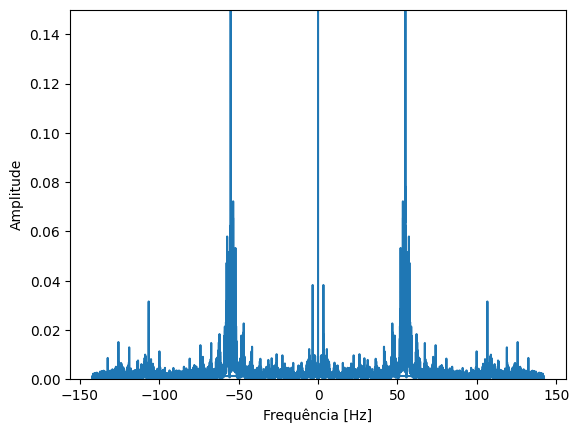

In [32]:
plt.plot(frequencies, abs(fft(x))/(N/2.0), label='Harmônicos')
#plt.plot(frequencies, np.abs(fft_result), label='FFT')
plt.ylim(0,0.15)
plt.ylabel('Amplitude')
plt.xlabel('Frequência [Hz]')
plt.show()

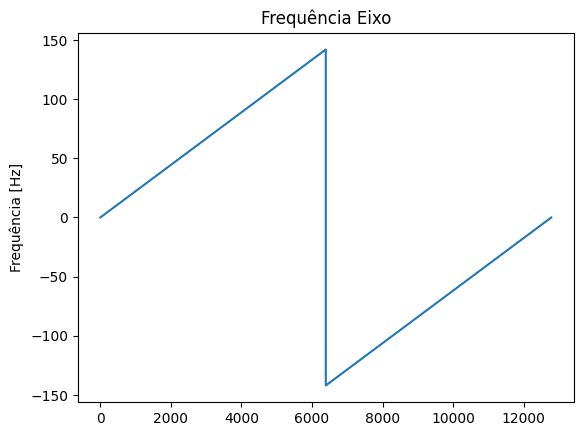

In [33]:
plt.plot(frequencies)
plt.ylabel('Frequência [Hz]')
plt.title('Frequência Eixo')
plt.show()

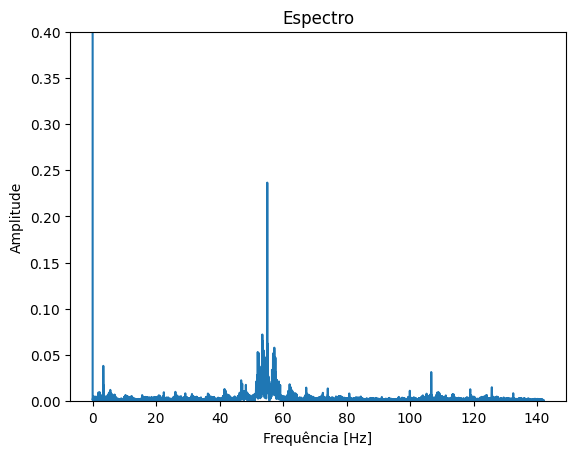

In [34]:
plt.plot(rfftfreq(N, d=1/sample_rate), np.abs(rfft(x))/(N/2.0))
plt.ylim(0,0.4)
plt.title('Espectro')
plt.xlabel('Frequência [Hz]')
plt.ylabel('Amplitude')
plt.show()

In [35]:
np.angle(rfft(x), deg=True)
fig =go.Figure(data=go.Scatterpolar(
    r = rfft(x).real,
    theta = np.angle(rfft(x), deg=False)
))
fig.show()

In [65]:
df[2].x.apply(lambda x: x).rolling(window=3, center=True).max()-df[2].x.apply(lambda x: x).rolling(window=5, center=True).min()

0         NaN
1         NaN
2        1.01
3        1.14
4        1.07
         ... 
12769    0.10
12770    0.10
12771    0.10
12772     NaN
12773     NaN
Name: x, Length: 12774, dtype: float64

In [426]:
df_c = df[1].copy()
window = 10
passo = 5
df_c['y_rms'] = df_c.y.apply(lambda y: y*y).rolling(window=window, min_periods=1).apply(lambda x: x[:-1].mean()).apply(np.sqrt)
df_c['pico_pico'] = df_c.y.rolling(window=window, min_periods=1).max()\
                    -df_c.y.rolling(window=window, min_periods=1).min()
df_c['y_rms']
df_c['sec'] = [td.total_seconds() for td in (df_c.t - df_c.t.iloc[0])]
df_c['sec']
ultimo_instante_ligado = 0
ligado = True
ultimo_instante_desligado = 0
tempo_desligado = 0
q = 0
for p in range(int(passo), len(df_c)-passo, int(passo)):
    #print(p, df_c.loc[p,'sec'], df_c.loc[p,'pico_pico'], df_c.loc[p,'y_rms'])
    if ((df_c.loc[p,'pico_pico'] <= 0.05) or (df_c.loc[p,'y_rms'] <= 0.5)) and ligado==True:
        ligado = False
        #ultimo_instante_desligado = df_c.loc[q,'sec']
        tempo_desligado = tempo_desligado + df_c.loc[p,'sec'] - df_c.loc[q,'sec']
        q = p
    elif ((df_c.loc[p,'pico_pico'] <= 0.05) or (df_c.loc[p,'y_rms'] <= 0.5)) and ligado==False:
        #ultimo_instante_desligado = df_c.loc[q,'sec']
        tempo_desligado = tempo_desligado + df_c.loc[p,'sec'] - df_c.loc[q,'sec']
        q = p
    else:
        ligado=True
        q = p
        #print('ligado en t=', ultimo_instante_desligado)
print('desligado ', tempo_desligado, 's')
df_c.iloc[-1:,7].values[0]
print('ligado ', df_c.iloc[-1:,7].values[0]-tempo_desligado, 's')

desligado  0.5280879999999968 s
ligado  53.471912 s


# Classe para fazer a analise comparativa

In [436]:
class Vibração:
    def __init__(self, df):
        self.x = df.x.to_numpy()
        self.y = df.y.to_numpy()
        self.z = df.z.to_numpy()
        self.t = df.t.to_numpy()
        self.t = df.index.to_numpy()
        self.N = df.shape[0]
        
        self.total_sec = tempo_op(df)
        self.sample_rate = self.N/self.total_sec
        
        self.fourier_x = fft(self.x)
        self.fourier_y = fft(self.y)
        self.fourier_z = fft(self.z)
        
        self.frequencias = fftfreq(self.N, 1.0/self.total_sec)
      
        
    def rms(self, imprime=True):
        self.rms_x = np.sqrt(np.mean(self.x**2))
        self.rms_y = np.sqrt(np.mean(self.y**2))
        self.rms_z = np.sqrt(np.mean(self.z**2))
        
        if imprime == True:
            print('Valor RMS para os eixos x: %1.2f, y: %1.2f, z: %1.2f' %(self.rms_x, self.rms_y, self.rms_z))
        
        return self.rms_x, self.rms_y, self.rms_z
    
    def pico_pico(self, imprime=True):
        self.pico_pico_x = np.max(self.x) - np.min(self.x)
        self.pico_pico_y = np.max(self.y) - np.min(self.y)
        self.pico_pico_z = np.max(self.z) - np.min(self.z)
        
        if imprime == True:
            print('Valor Pico-Pico para os eixos x: %1.2f, y: %1.2f, z: %1.2f'
                  %(self.pico_pico_x, self.pico_pico_y, self.pico_pico_z))
        
        return self.pico_pico_x, self.pico_pico_y, self.pico_pico_z
    
    
    def uptime_downtime(self, thresh=0.15):
        self.rms(imprime=False)
        self.pico_pico(imprime=False)
        
        magnitude_x = np.abs(self.fourier_x)
        magnitude_y = np.abs(self.fourier_y)
        magnitude_z = np.abs(self.fourier_z)
                
        magnitude_x = magnitude_x[magnitude_x <= 2000]
        #magnitude_y = magnitude_y[magnitude_y <= 2000]
        magnitude_z = magnitude_z[magnitude_z <= 2000]
        
        max_magnitude_x = np.max(magnitude_x)
        max_magnitude_y = np.max(magnitude_y)
        max_magnitude_z = np.max(magnitude_z)
        
        threshold_x = thresh*max_magnitude_x
        threshold_y = thresh*max_magnitude_y
        threshold_z = thresh*max_magnitude_z
        
        significant_peak_index_x = np.where(magnitude_x >= threshold_x)[0]
        significant_peak_index_y = np.where(magnitude_y >= threshold_y)[0]
        significant_peak_index_z = np.where(magnitude_z >= threshold_z)[0]  
        
        significant_peak_frequencies_x = self.frequencias[significant_peak_index_x]
        significant_peak_frequencies_y = self.frequencias[significant_peak_index_y]
        significant_peak_frequencies_z = self.frequencias[significant_peak_index_z]
         
        if (len(significant_peak_frequencies_x) <= 9000) and (len(significant_peak_frequencies_z) <= 9000) and \
            (self.rms_y >= 0.05) and (self.pico_pico_y >= 0.3):
            return True
        
        return False
    
    def plot_espectro(self, sample_rate=sample_rate, eixo='x'):
        
        if eixo=='x':
            plt.plot(rfftfreq(self.N, d=1/sample_rate), np.abs(rfft(self.x))/(self.N/2.0))
        
        elif eixo=='y':
            plt.plot(rfftfreq(self.N, d=1/sample_rate), np.abs(rfft(self.y))/(self.N/2.0))
           
        else:
            plt.plot(rfftfreq(self.N, d=1/sample_rate), np.abs(rfft(self.z))/(self.N/2.0))
           
        plt.ylim(0,0.4)
        plt.title('Espectro')
        plt.xlabel('Frequência [Hz]')
        plt.ylabel('Amplitude')
        plt.show()
        
    def plot_temperatura(self):
        plt.subplots(figsize=(13,7))
        plt.subplot(211)
        plt.plot(df[n].index*total_sec[n]/len(df[n]), df[n]['Temperature  ºC'])
        sns.regplot(data=df[n], x=df[n].index*total_sec[n]/len(df[n]), y=df[n]['Temperature  ºC'],
                    line_kws={'color':'b'}, scatter=False, label='Tendência')
        #plt.xlim(0,10)
        #plt.xlabel('Tempo [s]')
        plt.ylabel('Temperatura [ºC]')
        plt.title('Registro Completo')
        plt.legend()

        plt.subplot(212)
        plt.plot(df[n].index*total_sec[n]/len(df[n]), df[n]['Temperature  ºC'])
        plt.xlim(0,2)
        plt.xlabel('Tempo [s]')
        plt.ylabel('Temperatura [ºC]')
        plt.title('Zoom no tempo')
        plt.show()
        
    def phase(self):
        relative_phase_angle_xy = np.angle(self.fourier_x/self.fourier_y, deg=False)
        relative_phase_angle_yz = np.angle(self.fourier_y/self.fourier_z, deg=False)
        relative_phase_angle_zx = np.angle(self.fourier_z/self.fourier_x, deg=False)
        
        differen_phase_angle_xy = np.angle(self.fourier_x, deg=True)-np.angle(self.fourier_y, deg=True)
        differen_phase_angle_yz = np.angle(self.fourier_y, deg=True)-np.angle(self.fourier_z, deg=True)
        differen_phase_angle_zx = np.angle(self.fourier_z, deg=True)-np.angle(self.fourier_x, deg=True)
        
        #print(f'Valor fase para os eixos xy: {phase_angel_xy}, yz: {phase_angel_yz}, zx: {phase_angel_zx}')                
        
        return relative_phase_angle_xy, relative_phase_angle_yz, relative_phase_angle_zx,\
                differen_phase_angle_xy, differen_phase_angle_yz, differen_phase_angle_zx
        

In [264]:
for n in range(len(df)):
    vib = Vibração(df[n])
    print(n+1, end='\t')
    vib.rms()

1	Valor RMS para os eixos x: 9.30, y: 1.07, z: 1.63
2	Valor RMS para os eixos x: 9.28, y: 1.08, z: 1.64
3	Valor RMS para os eixos x: 9.29, y: 0.91, z: 1.56
4	Valor RMS para os eixos x: 9.28, y: 0.03, z: 1.18
5	Valor RMS para os eixos x: 9.28, y: 0.04, z: 1.15
6	Valor RMS para os eixos x: 9.27, y: 0.04, z: 1.12
7	Valor RMS para os eixos x: 9.27, y: 0.04, z: 1.12
8	Valor RMS para os eixos x: 9.27, y: 0.03, z: 1.13
9	Valor RMS para os eixos x: 9.27, y: 0.04, z: 1.09
10	Valor RMS para os eixos x: 9.30, y: 1.08, z: 1.78
11	Valor RMS para os eixos x: 9.28, y: 0.04, z: 1.12
12	Valor RMS para os eixos x: 9.28, y: 0.04, z: 1.12
13	Valor RMS para os eixos x: 9.28, y: 0.47, z: 1.38
14	Valor RMS para os eixos x: 9.29, y: 0.68, z: 1.49
15	Valor RMS para os eixos x: 9.30, y: 0.79, z: 1.65
16	Valor RMS para os eixos x: 9.30, y: 0.96, z: 1.51
17	Valor RMS para os eixos x: 9.30, y: 0.03, z: 1.09
18	Valor RMS para os eixos x: 9.30, y: 0.04, z: 1.10
19	Valor RMS para os eixos x: 9.29, y: 1.14, z: 1.86
20

In [427]:
for n in range(len(df)):
    vib = Vibração(df[n])
    print(f'{n+1}', f'Tempo: {vib.total_sec}', end='\t')
    vib.pico_pico()

1 Tempo: 45	Valor Pico-Pico para os eixos x: 1.32, y: 3.31, z: 3.13
2 Tempo: 54	Valor Pico-Pico para os eixos x: 1.40, y: 3.31, z: 3.39
3 Tempo: 68	Valor Pico-Pico para os eixos x: 5.03, y: 3.25, z: 7.99
4 Tempo: 66	Valor Pico-Pico para os eixos x: 0.27, y: 0.26, z: 0.37
5 Tempo: 67	Valor Pico-Pico para os eixos x: 0.27, y: 0.25, z: 0.37
6 Tempo: 67	Valor Pico-Pico para os eixos x: 0.25, y: 0.26, z: 0.35
7 Tempo: 66	Valor Pico-Pico para os eixos x: 0.29, y: 0.24, z: 0.37
8 Tempo: 67	Valor Pico-Pico para os eixos x: 0.25, y: 0.27, z: 0.39
9 Tempo: 66	Valor Pico-Pico para os eixos x: 0.24, y: 0.26, z: 0.39
10 Tempo: 66	Valor Pico-Pico para os eixos x: 1.59, y: 3.30, z: 4.11
11 Tempo: 68	Valor Pico-Pico para os eixos x: 0.24, y: 0.26, z: 0.39
12 Tempo: 67	Valor Pico-Pico para os eixos x: 0.24, y: 0.24, z: 0.40
13 Tempo: 65	Valor Pico-Pico para os eixos x: 2.69, y: 3.70, z: 8.56
14 Tempo: 67	Valor Pico-Pico para os eixos x: 2.42, y: 3.69, z: 5.69
15 Tempo: 66	Valor Pico-Pico para os eixos 

In [428]:
for n in range(len(df)):
    vib = Vibração(df[n])
    estado = vib.uptime_downtime()
    a = 'Ligado (Uptime)' if estado == True else 'Desligado (Downtime)'
    sentence = f'Motor em estado: {a}'
    print(n, vib.uptime_downtime())
    print(sentence)

0 True
Motor em estado: Ligado (Uptime)
1 True
Motor em estado: Ligado (Uptime)
2 True
Motor em estado: Ligado (Uptime)
3 False
Motor em estado: Desligado (Downtime)
4 False
Motor em estado: Desligado (Downtime)
5 False
Motor em estado: Desligado (Downtime)
6 False
Motor em estado: Desligado (Downtime)
7 False
Motor em estado: Desligado (Downtime)
8 False
Motor em estado: Desligado (Downtime)
9 True
Motor em estado: Ligado (Uptime)
10 False
Motor em estado: Desligado (Downtime)
11 False
Motor em estado: Desligado (Downtime)
12 True
Motor em estado: Ligado (Uptime)
13 True
Motor em estado: Ligado (Uptime)
14 True
Motor em estado: Ligado (Uptime)
15 True
Motor em estado: Ligado (Uptime)
16 False
Motor em estado: Desligado (Downtime)
17 False
Motor em estado: Desligado (Downtime)
18 True
Motor em estado: Ligado (Uptime)
19 True
Motor em estado: Ligado (Uptime)


In [ ]:
for n in range(len(df)):
    vib = Vibração(df[n])
    vib.plot_espectro(eixo='y')

In [ ]:
for n in range(len(df)):
    vib = Vibração(df[n])
    vib.plot_temperatura()

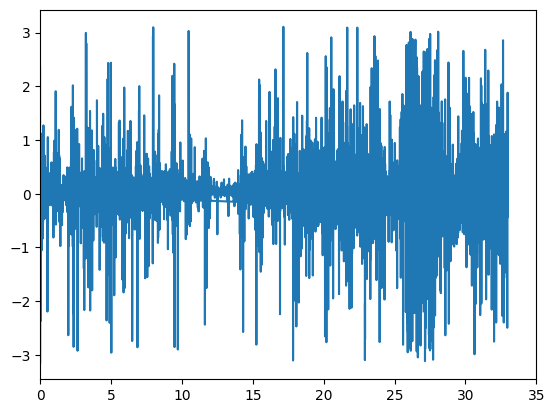

In [457]:
## for n in range(len(df)):
vib = Vibração(df[9])
phase_angle_xy, phase_angle_yz, phase_angle_zx, differen_phase_angle_xy, differen_phase_angle_yz, differen_phase_angle_zx = vib.phase()
#phase_angle_xy[np.abs(phase_angle_xy) < np.pi/2] = 0
phase_angle_yz[np.abs(phase_angle_yz) < np.pi/2] = 0
phase_angle_zx[np.abs(phase_angle_zx) < np.pi/2] = 0
plt.plot(vib.frequencias, phase_angle_xy)
#plt.plot(vib.frequencias, phase_angle_yz)
#plt.plot(vib.frequencias, phase_angle_zx)
plt.xlim(0,35)
plt.show()

In [458]:
vib.N
px.line(x=vib.frequencias, y=phase_angle_xy)

In [465]:
px.line(x=vib.frequencias, y=differen_phase_angle_xy)

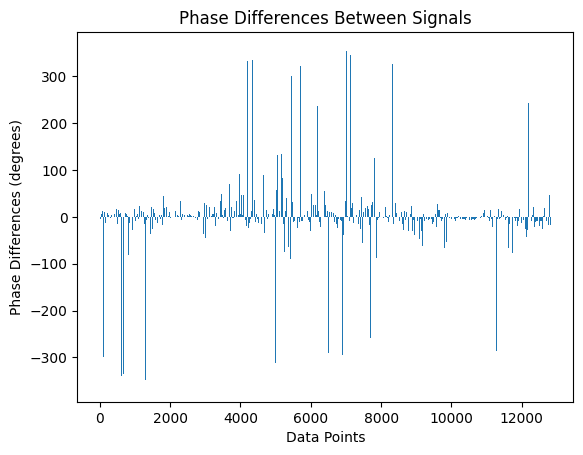

In [432]:
x = np.arange(len(differen_phase_angle_xy))
plt.bar(x, differen_phase_angle_xy)
plt.xlabel('Data Points')
plt.ylabel('Phase Differences (degrees)')
plt.title('Phase Differences Between Signals')
plt.show()

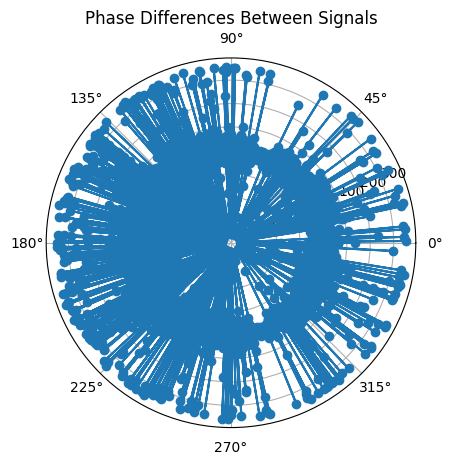

In [431]:
theta = np.linspace(0, 2*np.pi, len(differen_phase_angle_xy))
plt.polar(theta, differen_phase_angle_xy, marker='o')
plt.title('Phase Differences Between Signals')
plt.show()

# Referências
- Kong, Siauw & Bayen. Python Programming And Numerical Methods: A Guide For Engineers And Scientists https://pythonnumericalmethods.berkeley.edu/notebooks/Index.html